# Off Side Propagation

For an input fully to the left of the core region.  Here we want to see if we have high loss (resonant) wavelengths as in the hollow core case (we should (why?)) and if so does this input pass through the core for those cases.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from scipy.integrate import quad
from scipy.optimize import newton

plt.style.use('dark_background')
%matplotlib widget

In [2]:
A = SlabExact(symmetric=True, ns=[1, 1.44, 1], Ts=[8,2,8])

In [4]:
b = 1
shift = -6

Lx = shift - b
Rx = shift + b

def quadratic_piecewise(x):
    conds = [((x-shift)<-b), ((-b<=(x-shift))*((x-shift)<=b)), ((x-shift)>b)]
    funcs = [0, lambda x: 1 - ((x - shift) / b) ** 2, 0]
    return np.piecewise(x, conds, funcs)

f0 = quadratic_piecewise

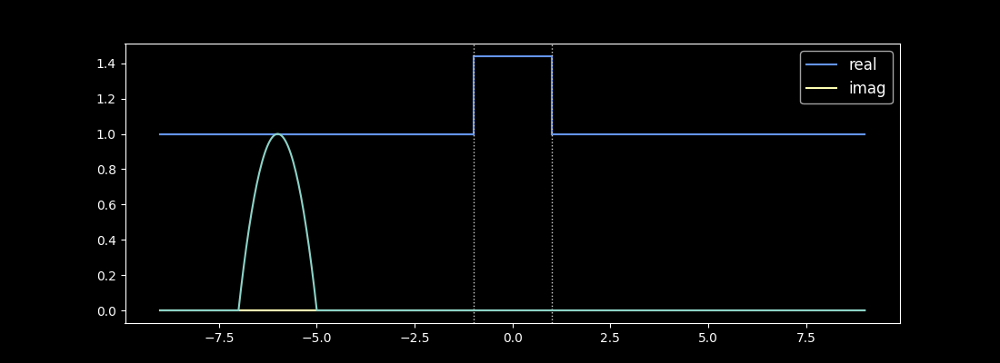

In [5]:
A.plot_refractive_index()
A.add_1d_plot(f0)

## Resonance investigation.

We calculate the resonant wavelengths for this guide.

In [6]:
resonant_wls = 2 * A.Ts[1] *  np.array([1/l for l in range(1,9)]) * np.sqrt(A.n_high**2 - A.n0**2) * A.scale
resonant_wls

array([4.14458683e-06, 2.07229342e-06, 1.38152894e-06, 1.03614671e-06,
       8.28917366e-07, 6.90764472e-07, 5.92083833e-07, 5.18073354e-07])

We look at the guided and leaky mode positions as a function of wavelength near a resonance

interactive(children=(FloatSlider(value=1.865064073966361e-06, description='wl', layout=Layout(width='90%'), m…

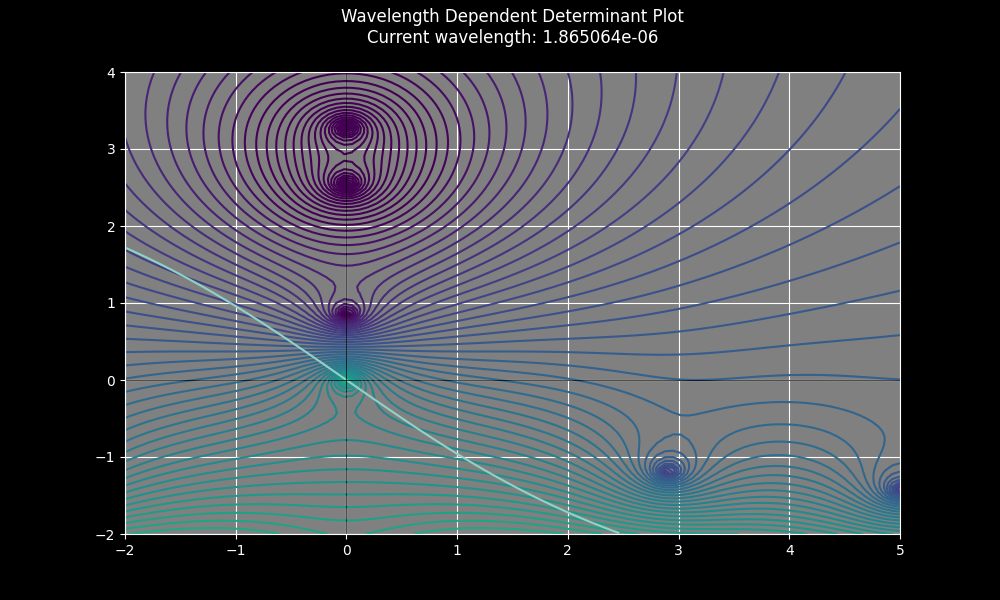

In [7]:
A.interactive_determinant_plot(-2, 5, -2, 4, 
                               minwl=.9*resonant_wls[1],
                               maxwl=1.25*resonant_wls[1],
                               sdp_sign=-1)

This behaves differently than the hollow core, the loss values of the leaky modes don't spike per-se.

We now look at the radiation modes near Z=0 for a resonant wavelength.

interactive(children=(FloatSlider(value=0.0001, description='Z', layout=Layout(width='90%'), max=1.0, min=0.00…

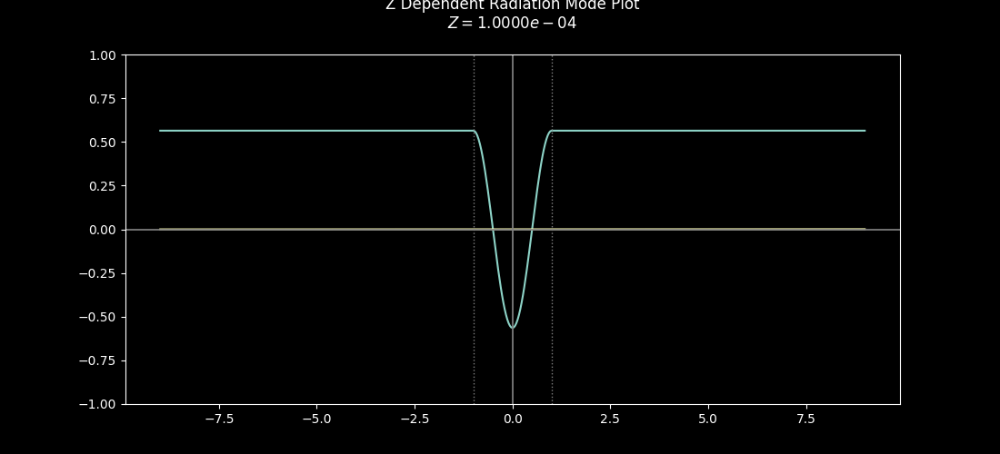

In [8]:
A.wl = resonant_wls[1]

A.interactive_radiation_mode_plot(minZ=1e-4, maxZ=1, ylims=(-1,1), sign='both', method='eigvec')

It appears there are only non-trivial even modes (at Z=0) when the number of half wavelengths is odd, i.e. we have .5 waves in the core, or 1.5 waves in the core, etc.  There are no non-trivial odd modes (at Z=0).

Now we assign a wavelength to investigate and move forward with propagation.

In [9]:
low_loss_wl = (resonant_wls[1] + resonant_wls[0]) / 2
high_loss_wl_non_trivial_mode = resonant_wls[1]
high_loss_wl_trivial_mode = resonant_wls[0]

# Low loss wavelength

In [10]:
A.wl = low_loss_wl

## Guided Portion

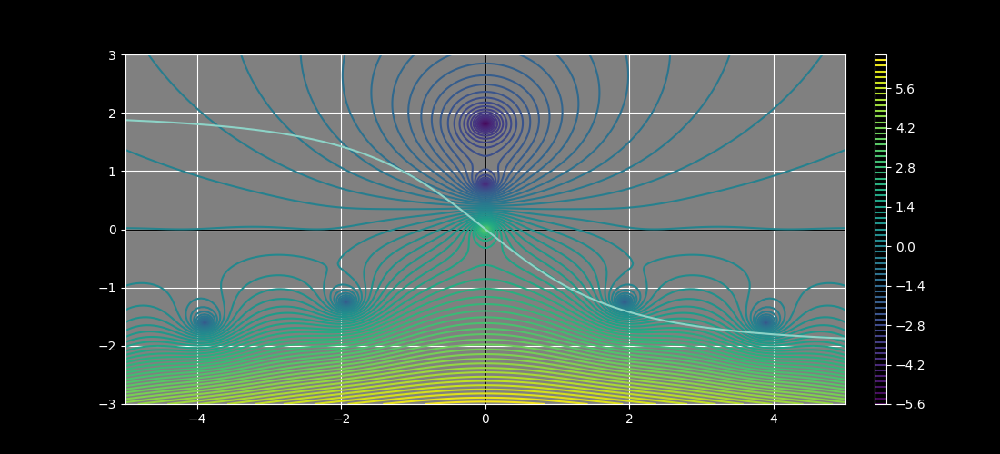

In [11]:
A.determinant_plot(-5, 5, -3, 3);

Get the guided mode propagagtion constants:

In [12]:
Zgo = newton(A.determinant, np.array(.5j))
Zge = newton(A.determinant, np.array(1.95j))

A.plot_points([Zgo, Zge])

In [13]:
Fge = A.fields(Zge)
Fgo = A.fields(Zgo)

In [14]:
alpha_odd = (quad(lambda x: f0(x) * Fgo(x), Lx, Rx, complex_func=True)[0]) / (quad(lambda x: Fgo(x) * Fgo(x), -8,8, complex_func=True)[0])
alpha_even = (quad(lambda x: f0(x) * Fge(x), Lx, Rx, complex_func=True)[0]) / (quad(lambda x: Fge(x) * Fge(x), -8, 8, complex_func=True)[0])

In [16]:
Guided = lambda x,z: alpha_odd * Fgo(x, z) + alpha_even * Fge(x, z)

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

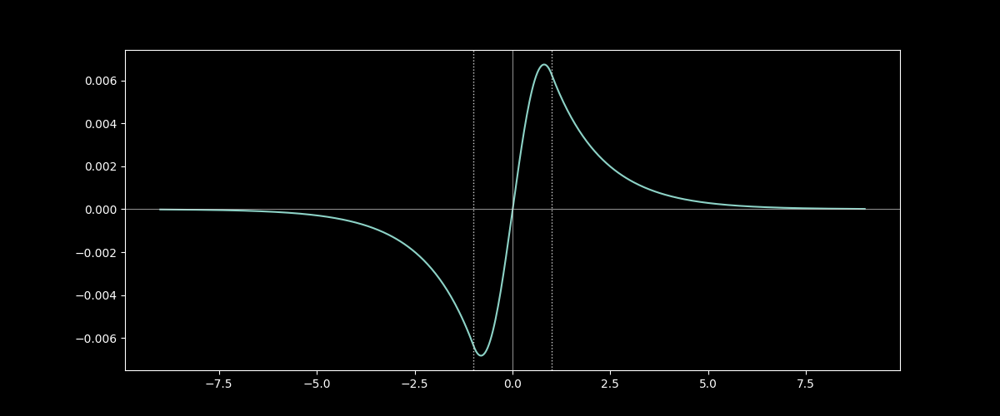

In [17]:
A.plot_field_1d(Guided,zs=np.linspace(1,10,1))

## Radiation Portion

In [18]:
Propagator = A.propagator()
method = 'ours'
Normalizer = A.normalizer(method=method)

In [19]:
contour = A.real_contour(.000001, A.Z_evanescent.real, 260)
Pe1 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=1)
Po1 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

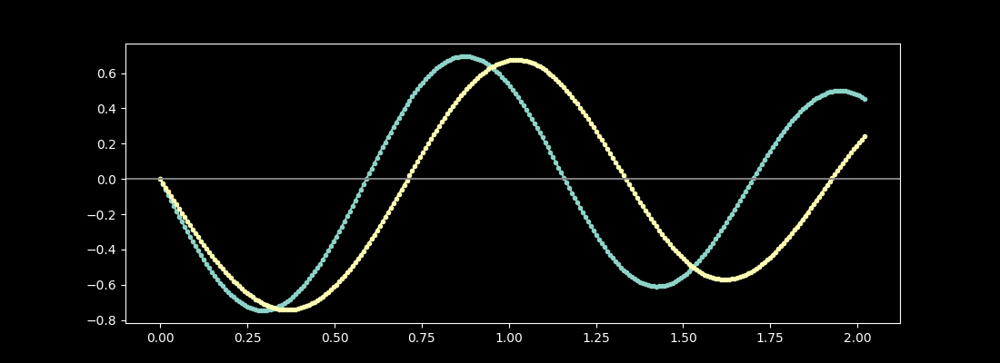

In [20]:
Pe1.plot_transform()
Po1.plot_transform(ax=plt.gca())

In [21]:
contour = A.real_contour(A.Z_evanescent.real, 7, 260)
Pe2 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=1)
Po2 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

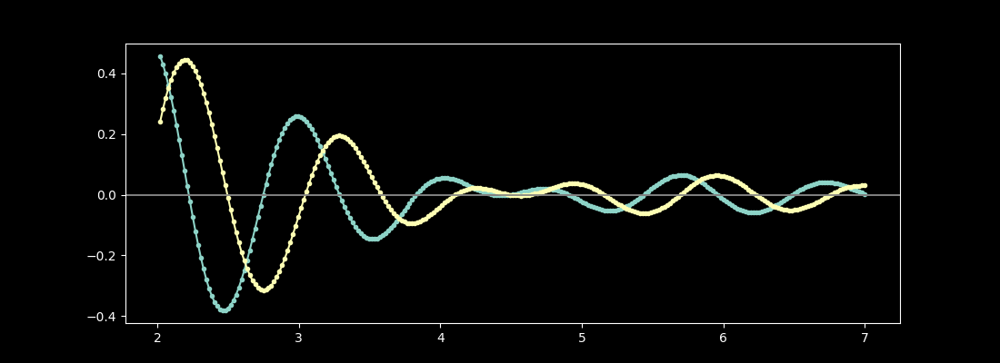

In [22]:
Pe2.plot_transform()
Po2.plot_transform(ax=plt.gca())

In [23]:
contour = A.real_contour(7, 30, 1000)
Pe3 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=1)
Po3 = Propagator(contour, f0=f0, Lx=Lx, Rx=Rx, Normalizer=Normalizer, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

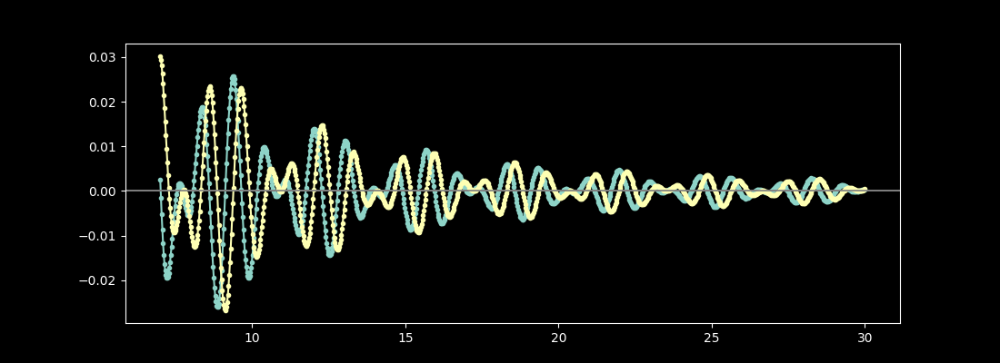

In [24]:
Pe3.plot_transform()
Po3.plot_transform(ax=plt.gca())

In [25]:
P_props = [
    Pe1,
    Po1,
]

P_evs = [
    Pe2,
    Po2,
    Pe3,
    Po3,
]

In [26]:
Prop = lambda x, z: sum([P.propagate(x, z) for P in P_props])
Ev = lambda x, z: sum([P.propagate(x, z) for P in P_evs])
Rad = lambda x, z: Prop(x,z) + Ev(x,z)
Full = lambda x, z: Rad(x,z) + Guided(x,z)

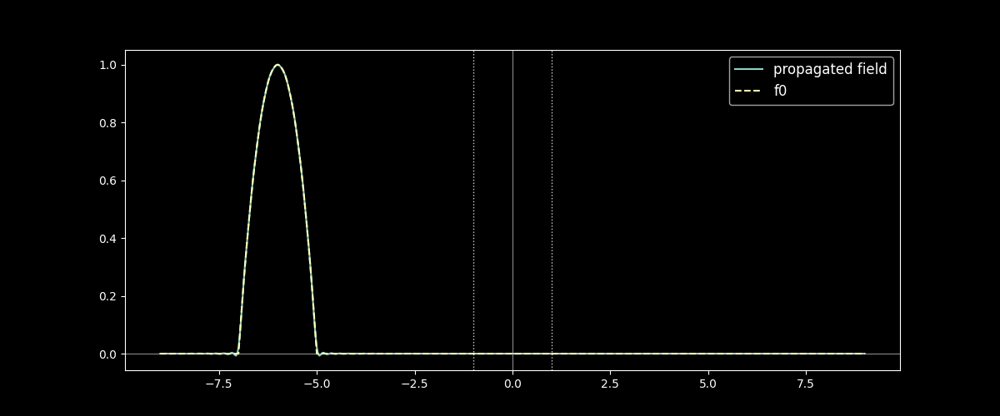

In [27]:
A.plot_field_1d(Full, label='propagated field')
A.add_1d_plot(f0, linestyle='--', label='f0')

(<Figure size 900x787.5 with 2 Axes>, <Axes: >)

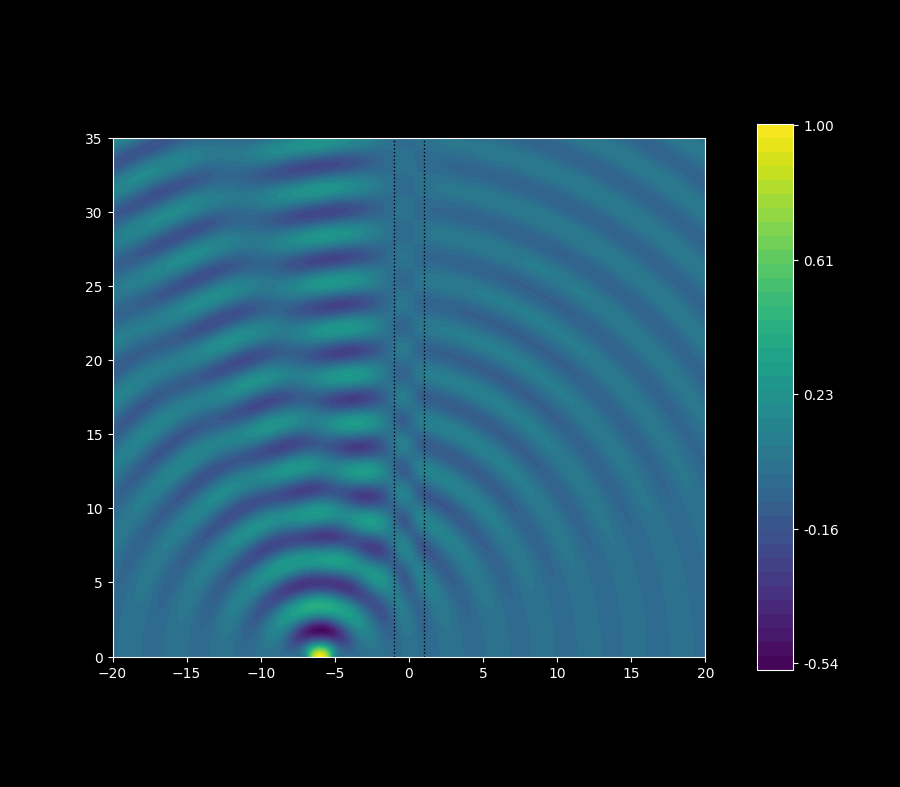

In [28]:
A.plot_field_2d(Full, zmax=35, zref=200, xs=np.linspace(-20,20,130))

(<Figure size 1000x500 with 1 Axes>, <Axes3D: >)

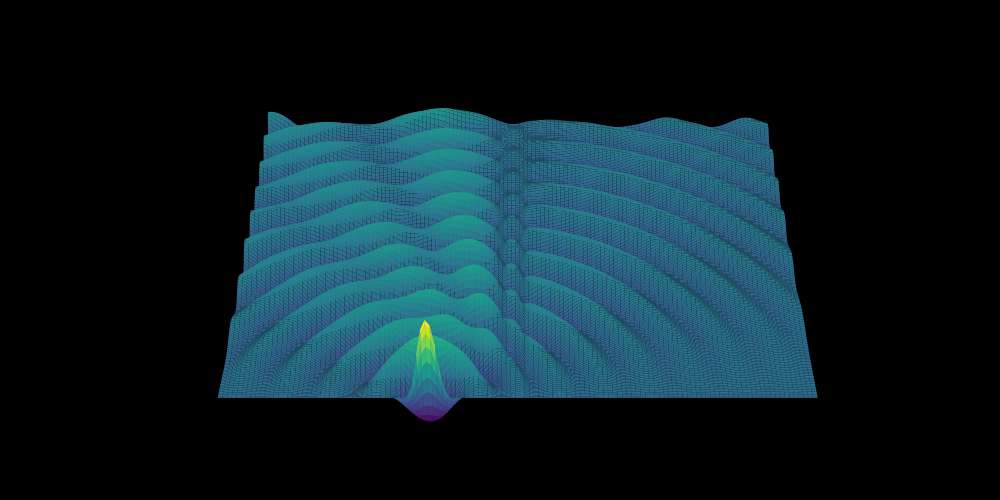

In [29]:
A.plot_field_2d_surface(Full, zmax=35, zref=200, xs=np.linspace(-20,20,130), cstride=1, rstride=1, elev=35)

# High loss wavelength trival mode

In [30]:
B = SlabExact(symmetric=True, ns=[1, 1.44, 1], Ts=[8,2,8])
B.wl = high_loss_wl_trivial_mode

## Guided Portion

(<Figure size 1100x500 with 2 Axes>, <Axes: >)

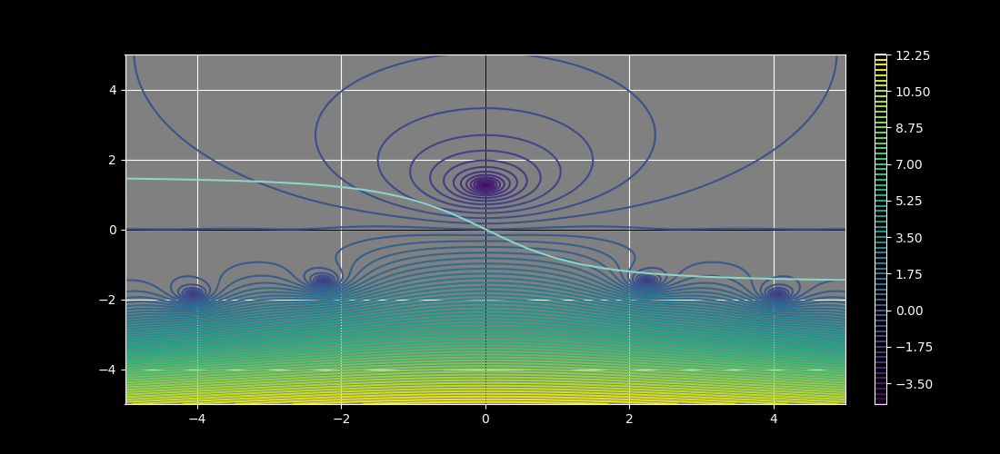

In [31]:
B.determinant_plot(-5, 5, -5, 5)

In [32]:
ZgeB = newton(B.determinant, np.array(1.95j))

B.plot_points(ZgeB)

In [33]:
FgeB = B.fields(ZgeB)


In [36]:
alpha_evenB = (quad(lambda x: f0(x) * FgeB(x), Lx, Rx, complex_func=True)[0]) / (quad(lambda x: FgeB(x) * FgeB(x), -8, 8, complex_func=True)[0])


In [37]:
GuidedB = lambda x,z: alpha_evenB * FgeB(x, z)

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

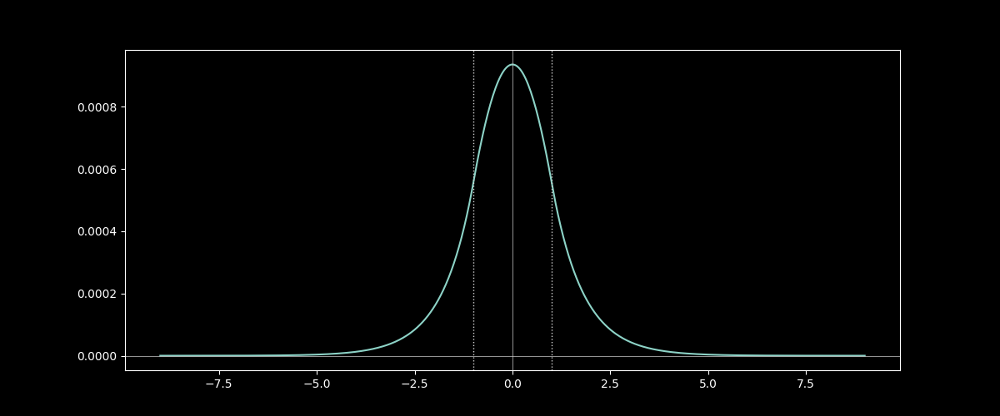

In [38]:
A.plot_field_1d(GuidedB)


## Radiation Portion

In [39]:
PropagatorB = B.propagator()

In [40]:
Pe1B = PropagatorB(B.real_contour(.000001, B.Z_evanescent.real, 360), f0=f0, Lx=Lx, Rx=Rx)
Po1B = PropagatorB(B.real_contour(.000001, B.Z_evanescent.real, 360), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

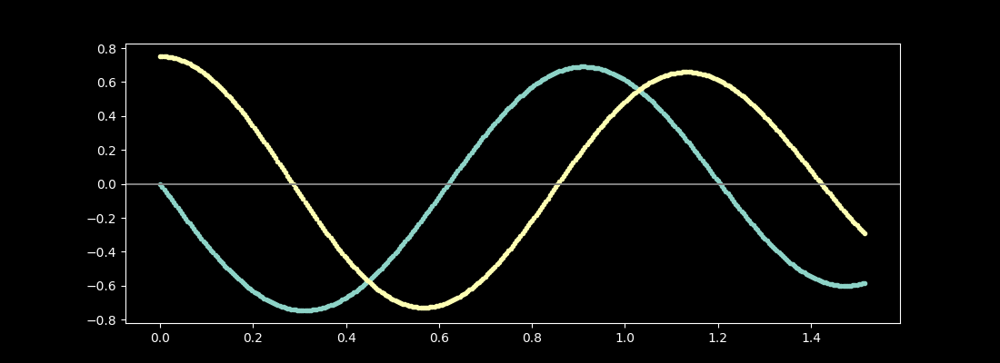

In [41]:
Pe1B.plot_transform()
Po1B.plot_transform(ax=plt.gca())

In [42]:
Pe2B = PropagatorB(B.real_contour(B.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx)
Po2B = PropagatorB(B.real_contour(B.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

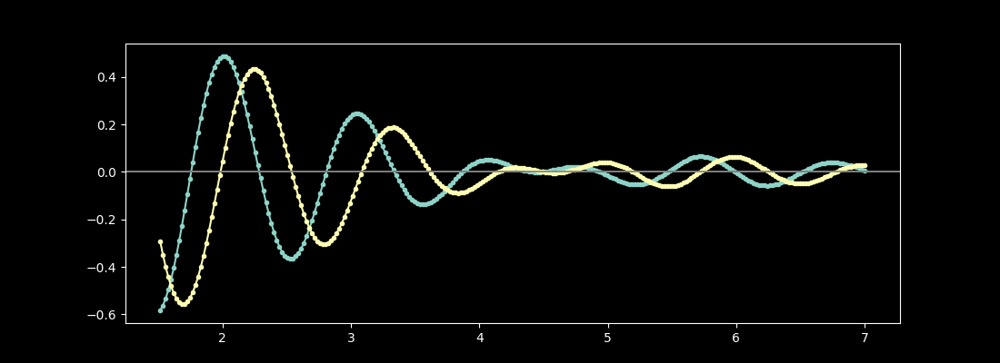

In [43]:
Pe2B.plot_transform()
Po2B.plot_transform(ax=plt.gca())

In [44]:
Pe3B = PropagatorB(B.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx)
Po3B = PropagatorB(B.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

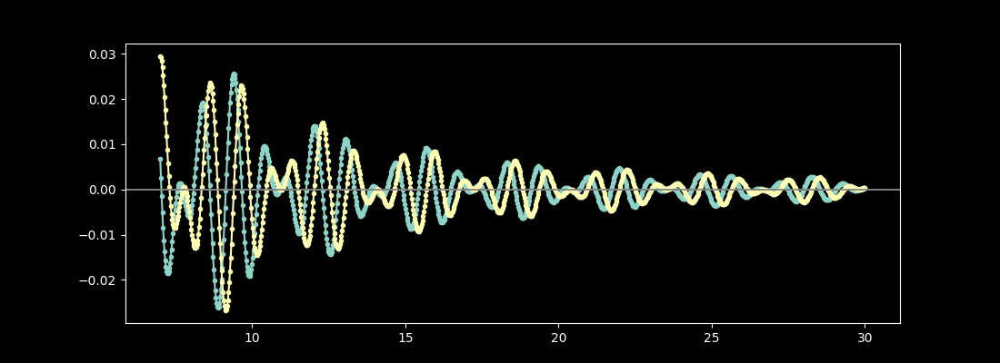

In [45]:
Pe3B.plot_transform()
Po3B.plot_transform(ax=plt.gca())

In [46]:
P_radsB = [
    Pe1B,
    Po1B,
    Pe2B,
    Po2B,
    Pe3B,
    Po3B,
]

In [47]:
RadB = lambda x, z: sum([P.propagate(x, z) for P in P_radsB])
FullB = lambda x, z: RadB(x,z) + GuidedB(x,z)

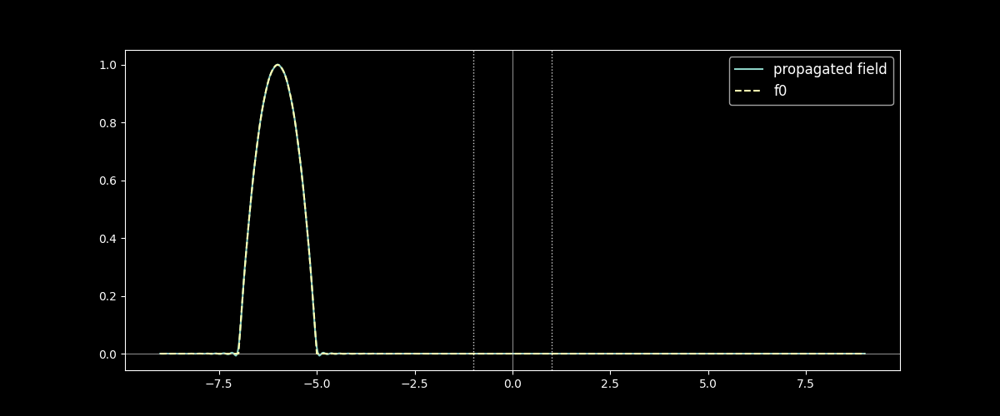

In [48]:
B.plot_field_1d(FullB, label='propagated field')
B.add_1d_plot(f0, linestyle='--', label='f0')

(<Figure size 900x787.5 with 2 Axes>, <Axes: >)

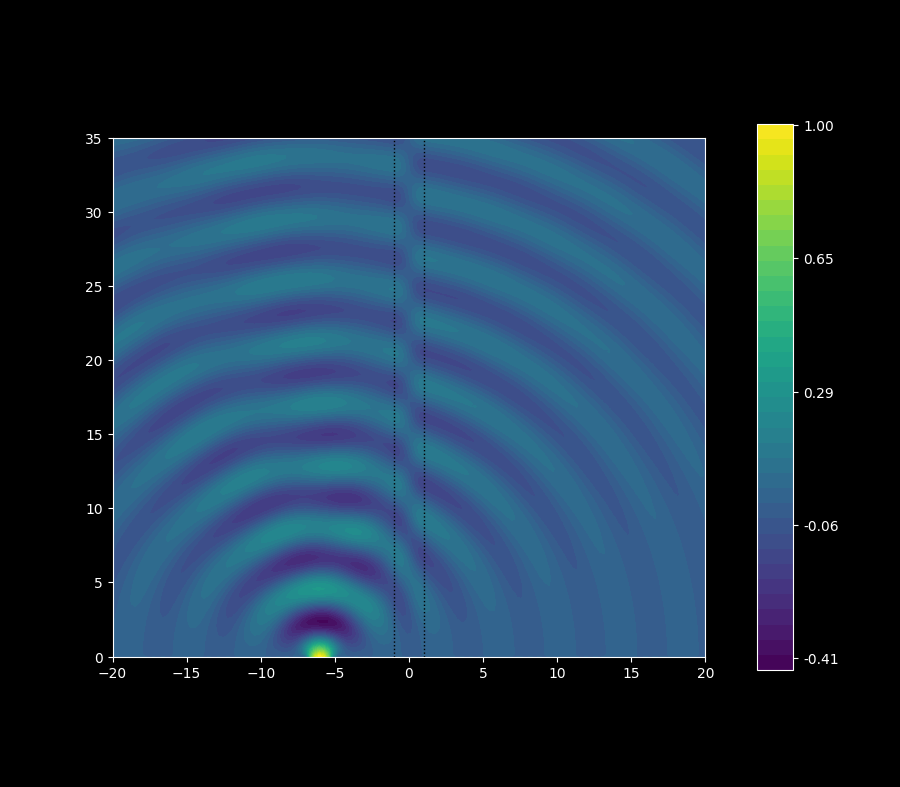

In [49]:
B.plot_field_2d(FullB, zmax=35, zref=200, xs=np.linspace(-20,20,130))

(<Figure size 1000x500 with 1 Axes>, <Axes3D: >)

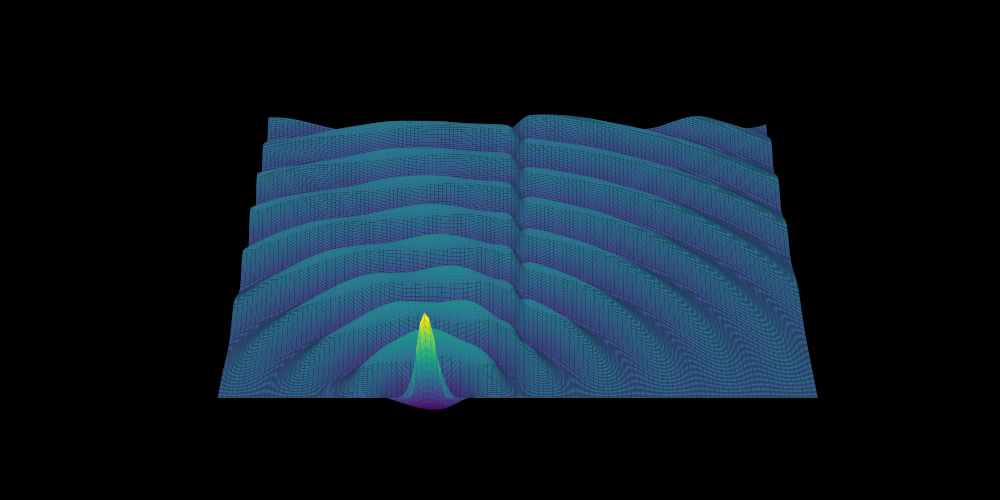

In [50]:
B.plot_field_2d_surface(FullB, zmax=35, zref=250, xs=np.linspace(-20,20,130), cstride=1, rstride=1, elev=35)

# High loss wavelength non trival mode

In [51]:
C = SlabExact(symmetric=True, ns=[1, 1.44, 1], Ts=[8,2,8])
C.wl = high_loss_wl_non_trivial_mode

## Guided Portion

(<Figure size 1100x500 with 2 Axes>, <Axes: >)

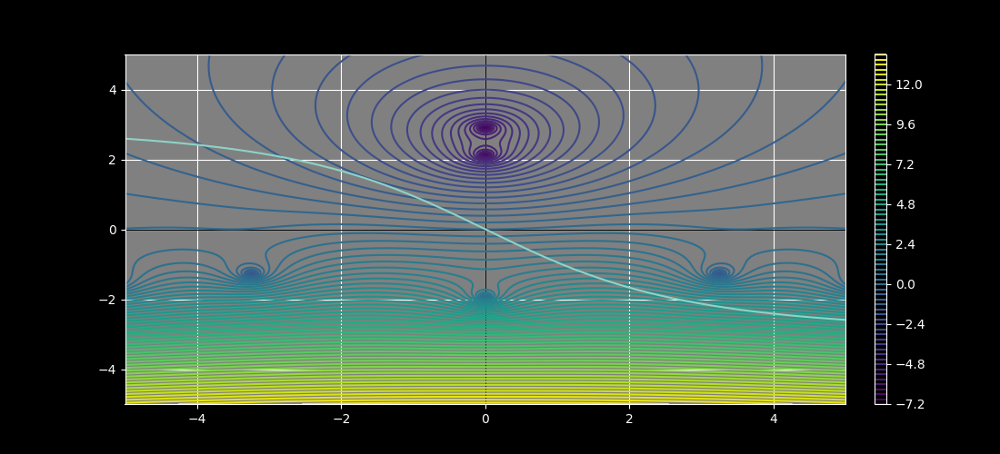

In [52]:
C.determinant_plot(-5, 5, -5, 5)

In [53]:
ZgoC = newton(C.determinant, np.array(3.5j))
ZgeC = newton(C.determinant, np.array(1.95j))

C.plot_points([ZgeC, ZgoC])

In [54]:
FgeC = C.fields(ZgeC)
FgoC = C.fields(ZgoC)

In [55]:
alpha_oddC = (quad(lambda x: f0(x) * FgoC(x), Lx, Rx, complex_func=True)[0]) / (quad(lambda x: FgoC(x) * FgoC(x), -8,8, complex_func=True)[0])
alpha_evenC = (quad(lambda x: f0(x) * FgeC(x), Lx, Rx, complex_func=True)[0]) / (quad(lambda x: FgeC(x) * FgeC(x), -8, 8, complex_func=True)[0])

In [56]:
GuidedC = lambda x,z: alpha_oddC * FgoC(x, z) + alpha_evenC * FgeC(x, z)

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

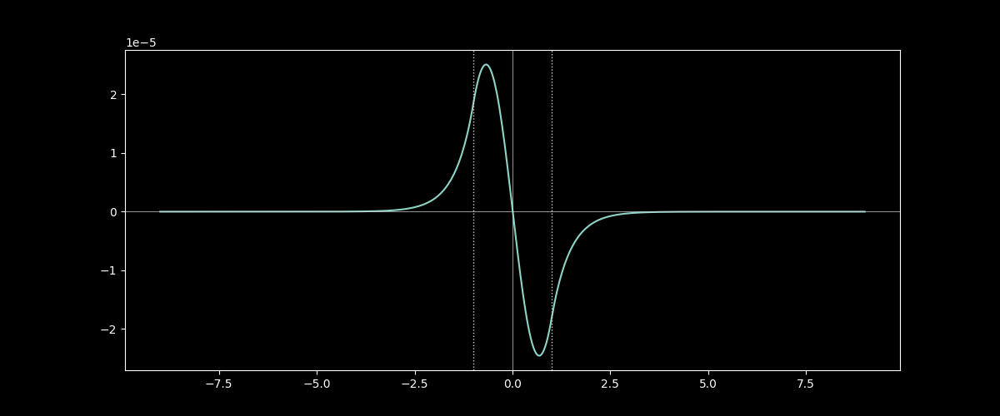

In [57]:
C.plot_field_1d(GuidedC)


## Radiation Portion

In [58]:
PropagatorC = C.propagator()

In [59]:
Pe1C = PropagatorC(C.real_contour(.000001, C.Z_evanescent.real, 260), f0=f0, Lx=Lx, Rx=Rx)
Po1C = PropagatorC(C.real_contour(.000001, C.Z_evanescent.real, 260), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

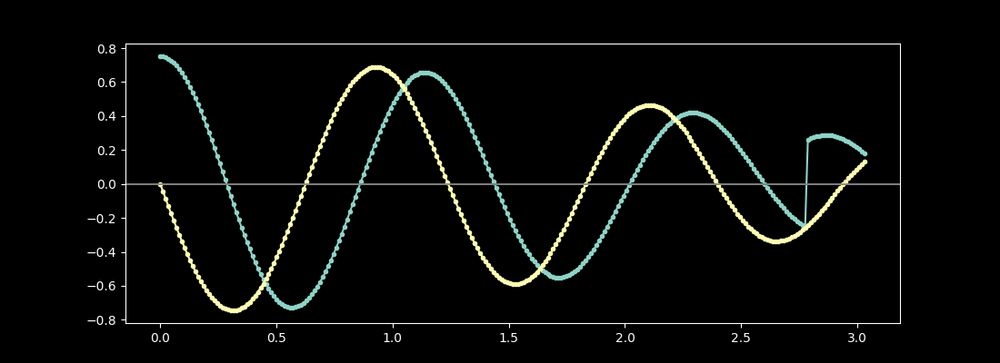

In [60]:
Pe1C.plot_transform()
Po1C.plot_transform(ax=plt.gca())

In [61]:
Pe2C = PropagatorC(C.real_contour(C.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx)
Po2C = PropagatorC(C.real_contour(C.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

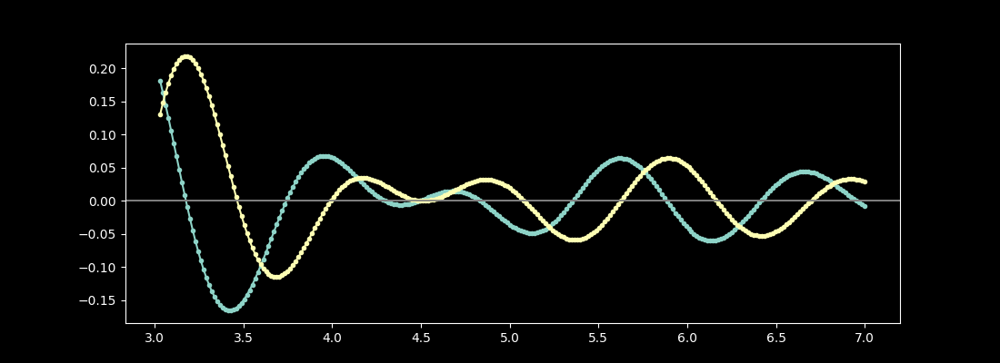

In [62]:
Pe2C.plot_transform()
Po2C.plot_transform(ax=plt.gca())

In [63]:
Pe3C = PropagatorC(C.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx)
Po3C = PropagatorC(C.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

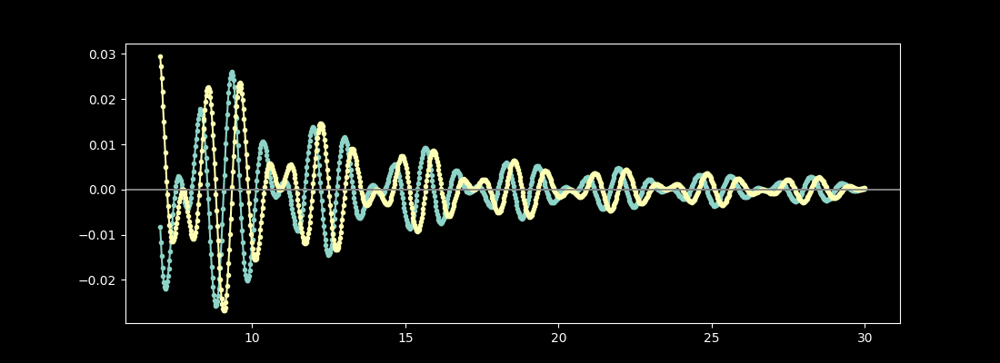

In [64]:
Pe3C.plot_transform()
Po3C.plot_transform(ax=plt.gca())

In [65]:
P_radsC = [
    Pe1C,
    Po1C,
    Pe2C,
    Po2C,
    Pe3C,
    Po3C,
]

In [66]:
RadC = lambda x, z: sum([P.propagate(x, z) for P in P_radsC])
FullC = lambda x, z: RadC(x,z) + GuidedC(x,z)

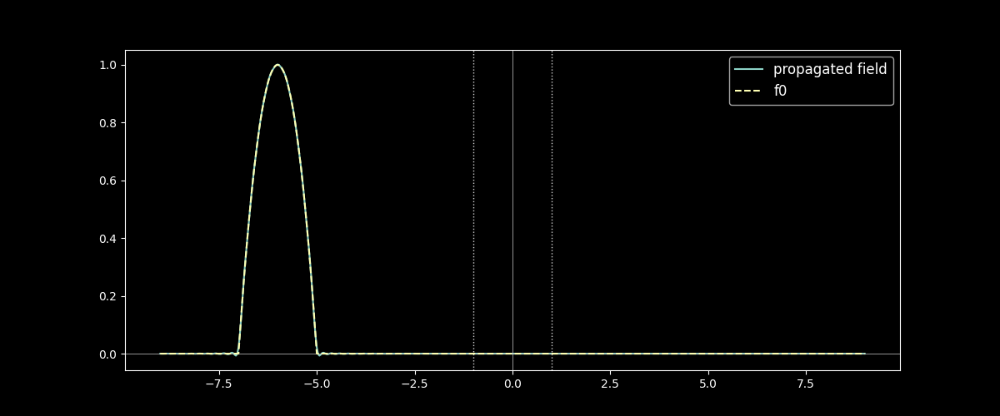

In [67]:
C.plot_field_1d(FullC, label='propagated field')
C.add_1d_plot(f0, linestyle='--', label='f0')

(<Figure size 900x787.5 with 2 Axes>, <Axes: >)

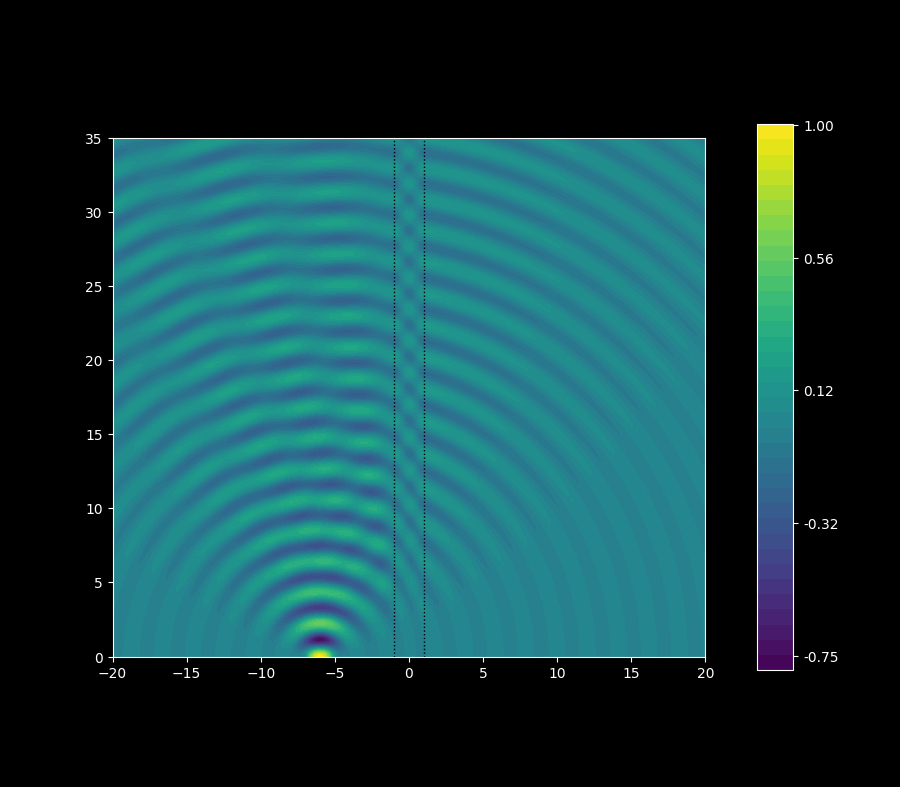

In [68]:
C.plot_field_2d(FullC, zmax=35, zref=200, xs=np.linspace(-20,20,130))

# Comparison Fields

In order of increasing wavelength.

## High loss wavelength (trival mode)

(<Figure size 1000x500 with 1 Axes>, <Axes3D: >)

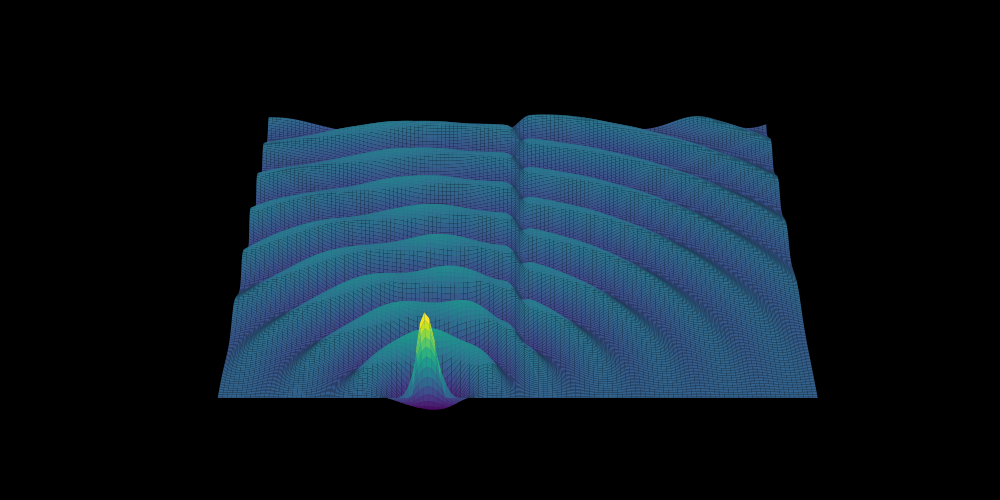

In [69]:
B.plot_field_2d_surface(FullB, zmax=35, zref=200, xs=np.linspace(-20,20,130), cstride=1, rstride=1, elev=35)

## Low loss wavelength

(<Figure size 1000x500 with 1 Axes>, <Axes3D: >)

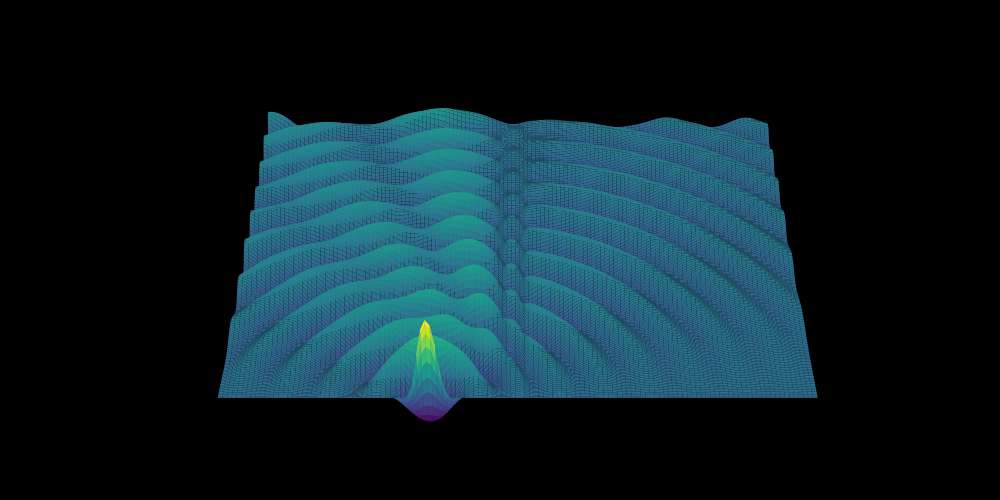

In [70]:
A.plot_field_2d_surface(Full, zmax=35, zref=200, xs=np.linspace(-20,20,130), cstride=1, rstride=1, elev=35)

## High loss wavelength (non-trival mode)

(<Figure size 1000x500 with 1 Axes>, <Axes3D: >)

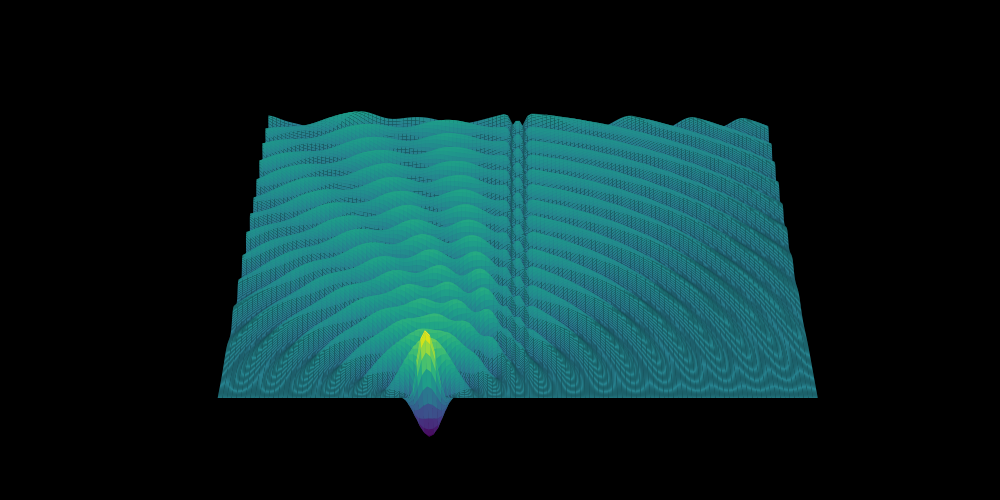

In [71]:
C.plot_field_2d_surface(FullC, zmax=35, zref=300, xs=np.linspace(-20,20,130), cstride=1, rstride=1, elev=35)

# Observations

- For both resonant wavelengths, we can tell more gets through to right hand side.

- It's also apparent that activity in the core carries along in direction of propagation much farther for resonant wavelengths, where for non-resonant wavelength it dies out.

- The above is not guided mode activity however, so it should die out eventually.  But we also see this with the hollow core.  Perhaps this activity is not propagating energy.

- Does all of this mean anything about lossiness of leaky modes at these wavelengths?

(<Figure size 1100x500 with 2 Axes>, <Axes: >)

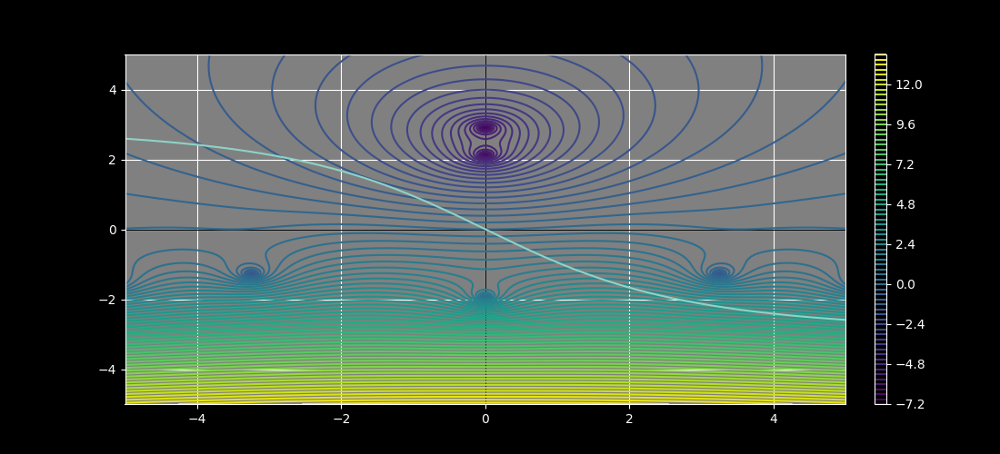

In [72]:
C.determinant_plot(-5,5, -5,5)

interactive(children=(FloatSlider(value=0.001, description='Z', layout=Layout(width='90%'), max=1.0, min=0.001…

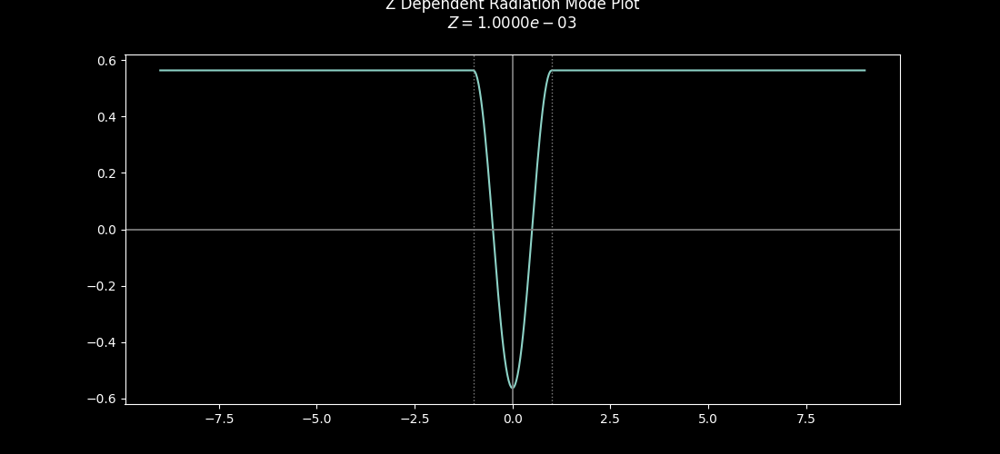

In [73]:
C.interactive_radiation_mode_plot()

# High loss wavelength trival mode, higher wavelength

In [74]:
D = SlabExact(symmetric=True, ns=[1, 1.44, 1], Ts=[8,2,8])
D.wl = resonant_wls[2]

interactive(children=(FloatSlider(value=1e-07, description='Z', layout=Layout(width='90%'), max=1.0, min=1e-07…

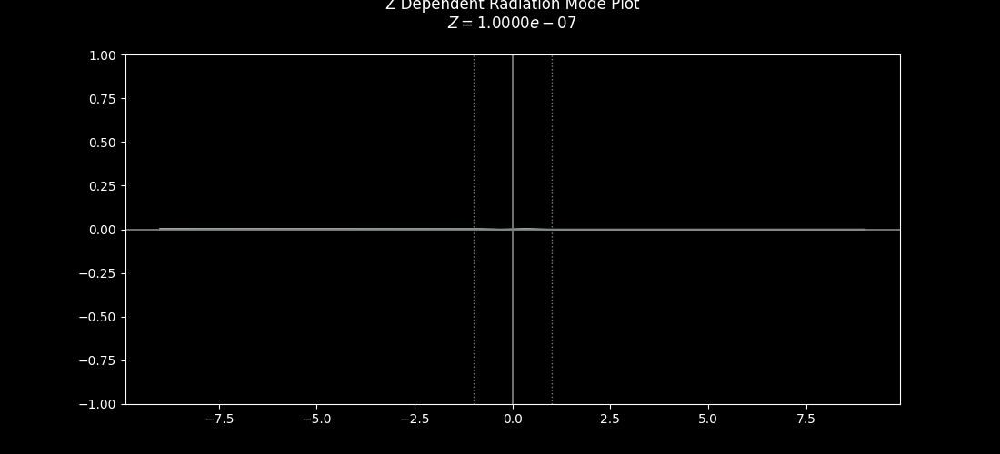

In [75]:
D.interactive_radiation_mode_plot(minZ=1e-7, ylims=(-1,1))

## Radiation Portion

In [76]:
PropagatorD = D.propagator()

In [77]:
Pe1D = PropagatorD(D.real_contour(.000001, D.Z_evanescent.real, 260), f0=f0, Lx=Lx, Rx=Rx)
Po1D = PropagatorD(D.real_contour(.000001, D.Z_evanescent.real, 260), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

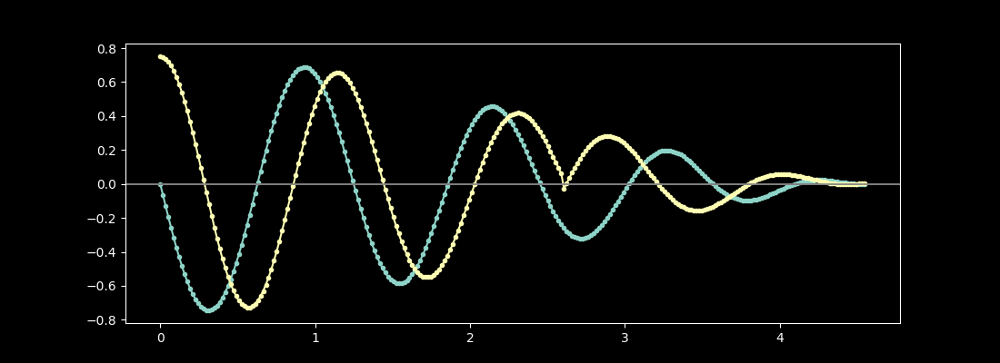

In [78]:
Pe1D.plot_transform()
Po1D.plot_transform(ax=plt.gca())

In [79]:
Pe2D = PropagatorD(D.real_contour(D.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx)
Po2D = PropagatorD(D.real_contour(D.Z_evanescent.real, 7, 260), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

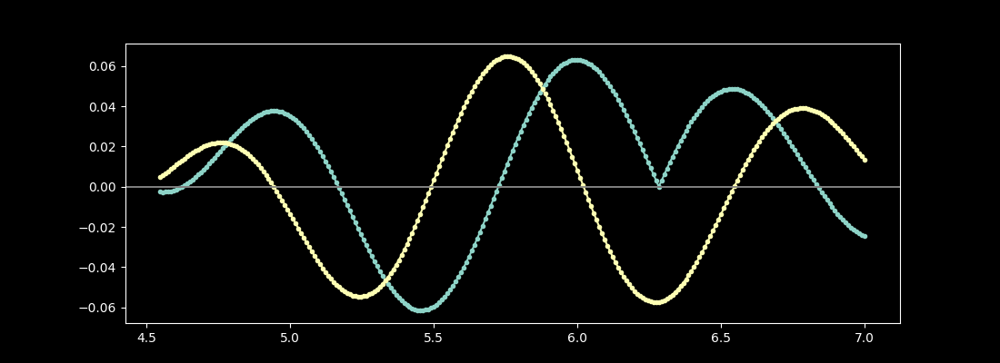

In [80]:
Pe2D.plot_transform()
Po2D.plot_transform(ax=plt.gca())

In [81]:
Pe3D = PropagatorD(D.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx)
Po3D = PropagatorD(D.real_contour(7, 30, 1000), f0=f0, Lx=Lx, Rx=Rx, sign=-1)

(<Figure size 1100x400 with 1 Axes>, <Axes: >)

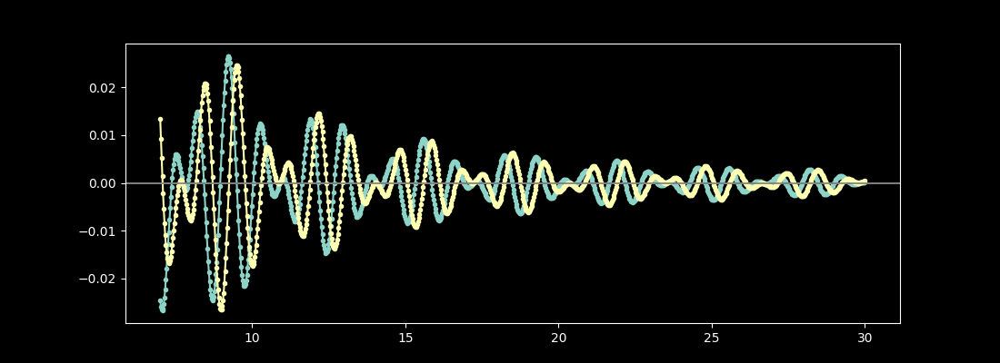

In [82]:
Pe3D.plot_transform()
Po3D.plot_transform(ax=plt.gca())

In [83]:
P_radsD = [
    Pe1D,
    Po1D,
    Pe2D,
    Po2D,
    Pe3D,
    Po3D,
]

In [85]:
RadD = lambda x, z: sum([P.propagate(x, z) for P in P_radsD])
FullD = lambda x, z: RadC(x,z)

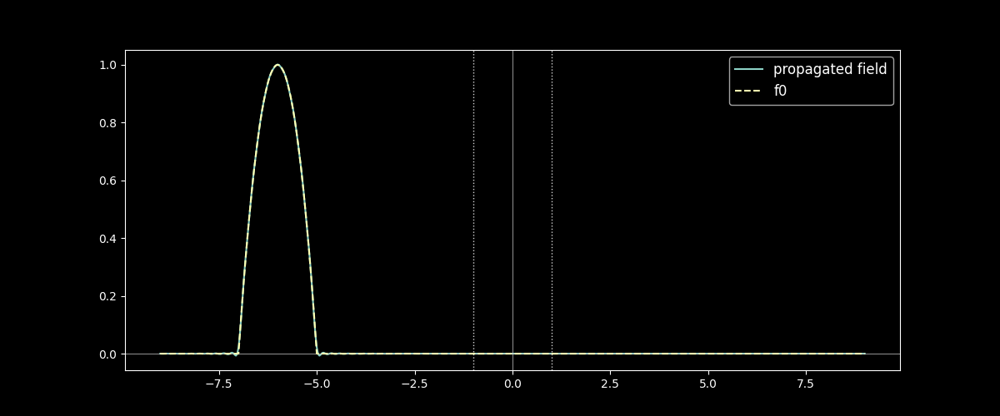

In [86]:
C.plot_field_1d(FullD, label='propagated field')
C.add_1d_plot(f0, linestyle='--', label='f0')

(<Figure size 900x787.5 with 2 Axes>, <Axes: >)

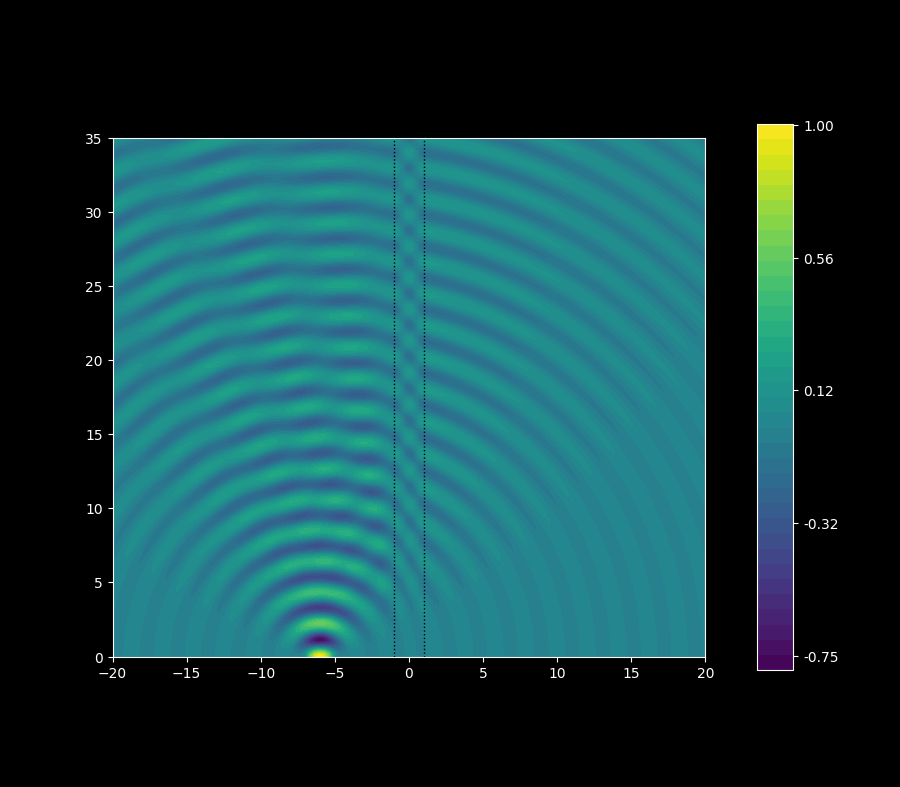

In [87]:
C.plot_field_2d(FullD, zmax=35, zref=200, xs=np.linspace(-20,20,130))